### Try-it 8.1: The "Best" Model

This module was all about regression and using Python's scikitlearn library to build regression models.  Below, a dataset related to real estate prices in California is given. While many of the assignments you have built and evaluated different models, it is important to spend some time interpreting the resulting "best" model.  


Your goal is to build a regression model to predict the price of a house in California.  After doing so, you are to *interpret* the model.  There are many strategies for doing so, including some built in methods from scikitlearn.  One example is `permutation_importance`.  Permutation feature importance is a strategy for inspecting a model and its features importance.  

Take a look at the user guide for `permutation_importance` [here](https://scikit-learn.org/stable/modules/permutation_importance.html).  Use  the `sklearn.inspection` modules implementation of `permutation_importance` to investigate the importance of different features to your regression models.  Share these results on the discussion board.

In [122]:
import pandas as pd
from sklearn.inspection import permutation_importance
from sklearn.pipeline import Pipeline
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import OneHotEncoder, PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import plotly.express as px
from sklearn.compose import make_column_transformer, make_column_selector
from sklearn.inspection import permutation_importance


In [123]:
import numpy as np
import matplotlib.pyplot as plt

In [124]:
cali = pd.read_csv('data/housing.csv')

In [125]:
cali.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


In [126]:
cali.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


In [127]:
cali['ocean_proximity'].unique()

array(['NEAR BAY', '<1H OCEAN', 'INLAND', 'NEAR OCEAN', 'ISLAND'],
      dtype=object)

In [128]:
cali['total_bedrooms'].fillna(value = np.mean(cali['total_bedrooms']), inplace = True)
cali.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20640 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


In [129]:
cali.corr()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
longitude,1.000000,-0.924664,-0.108197,0.044568,0.069260,0.099773,0.055310,-0.015176,-0.045967
latitude,-0.924664,1.000000,0.011173,-0.036100,-0.066658,-0.108785,-0.071035,-0.079809,-0.144160
housing_median_age,-0.108197,0.011173,1.000000,-0.361262,-0.318998,-0.296244,-0.302916,-0.119034,0.105623
total_rooms,0.044568,-0.036100,-0.361262,1.000000,0.927253,0.857126,0.918484,0.198050,0.134153
total_bedrooms,0.069260,-0.066658,-0.318998,0.927253,1.000000,0.873910,0.974725,-0.007682,0.049454
population,0.099773,-0.108785,-0.296244,0.857126,0.873910,1.000000,0.907222,0.004834,-0.024650
households,0.055310,-0.071035,-0.302916,0.918484,0.974725,0.907222,1.000000,0.013033,0.065843
median_income,-0.015176,-0.079809,-0.119034,0.198050,-0.007682,0.004834,0.013033,1.000000,0.688075
median_house_value,-0.045967,-0.144160,0.105623,0.134153,0.049454,-0.024650,0.065843,0.688075,1.000000


In [130]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

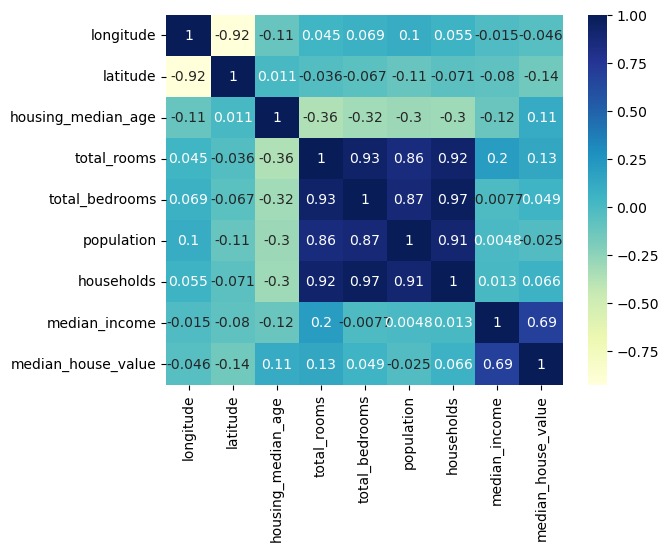

In [131]:
heatmap = sns.heatmap(cali.corr(), cmap="YlGnBu", annot=True)

In [132]:
#  code to look at median_house_value correlation
cali.corrwith(cali['median_house_value'])

longitude            -0.045967
latitude             -0.144160
housing_median_age    0.105623
total_rooms           0.134153
total_bedrooms        0.049454
population           -0.024650
households            0.065843
median_income         0.688075
median_house_value    1.000000
dtype: float64

In [133]:
mses = {}
mses_df = pd.DataFrame(mses, columns = ['Estimator', 'MSE'])
print(mses_df)

Empty DataFrame
Columns: [Estimator, MSE]
Index: []


In [134]:
mses_df.drop(mses_df.index[0:2], inplace = True)
# mses_df.drop('mse', axis = 1, inplace= True)
mses_df

,Estimator,MSE


In [135]:
#mses_df.loc[len(mses_df.index)] = ('kfg', 350)
mses_df

,Estimator,MSE


In [136]:
# single feature lfr..extremely high mse
lr_1_feature = LinearRegression(fit_intercept = False).fit(cali[['housing_median_age']], cali['median_house_value'])
mse = mean_squared_error(y, lr_1_feature.predict(cali[['housing_median_age']]))
print(mses)
new_record = pd.DataFrame()
mses_df = mses_df.append({'Estimator': 'LG_1 Feature', 'MSE':  mse}, ignore_index = True)
print(mses_df)

{}
      Estimator           MSE
0  LG_1 Feature  1.835976e+10


/var/folders/kf/0f7t7jlj05d948lftjhjgf640000gn/T/ipykernel_94221/1024361393.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



In [137]:
# only the categorical feature...lower than the single feature but still high
ocean_proximity_encoded = pd.get_dummies(cali[['ocean_proximity']])
ocean_proximity_encoded
X = ocean_proximity_encoded
y = cali['median_house_value']
ocean_prox_lr = LinearRegression(fit_intercept = False).fit(X,y)
mse = mean_squared_error(y, ocean_prox_lr.predict(X))
print(mse)
mses_df = mses_df.append({'Estimator': 'LR_1cat', 'MSE':  mse}, ignore_index = True)
mses_df

10145098153.988123


/var/folders/kf/0f7t7jlj05d948lftjhjgf640000gn/T/ipykernel_94221/2109494338.py:9: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Estimator,MSE
0,LG_1 Feature,1.835976e+10
1,LR_1cat,1.014510e+10


In [138]:
# multiple features...start by thinking what are likely....mean squared getting lower than just 1 feature 
X = cali[['housing_median_age', 'households', 'median_income']]
y = cali['median_house_value']
lr_3_features = LinearRegression(fit_intercept = False).fit(X,y)
mse = mean_squared_error(y, lr_3_features.predict(X))
print(mse)
mses_df = mses_df.append({'Estimator': 'LR_3Features', 'MSE':  mse}, ignore_index = True)
mses_df.drop_duplicates(inplace = True)
mses_df

6443436750.18058


/var/folders/kf/0f7t7jlj05d948lftjhjgf640000gn/T/ipykernel_94221/3431852424.py:7: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Estimator,MSE
0,LG_1 Feature,1.835976e+10
1,LR_1cat,1.014510e+10
2,LR_3Features,6.443437e+09


In [139]:
# all numeric values lr...continues to get lower MSE
X = cali.drop(['median_house_value', 'ocean_proximity'], axis = 1)
y = cali['median_house_value']
X.head()
test_lr = LinearRegression(fit_intercept = False).fit(X,y)
mse = mean_squared_error(y, test_lr.predict(X))
print(mse)
test_lr.coef_
mses_df = mses_df.append({'Estimator': 'LR_numeric', 'MSE':  mse}, ignore_index = True)
mses_df.drop_duplicates(inplace = True)
mses_df

5616605976.679559


/var/folders/kf/0f7t7jlj05d948lftjhjgf640000gn/T/ipykernel_94221/3642794169.py:9: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Estimator,MSE
0,LG_1 Feature,1.835976e+10
1,LR_1cat,1.014510e+10
2,LR_3Features,6.443437e+09
3,LR_numeric,5.616606e+09


In [140]:
# change ocean_proximity to dummies
X = pd.get_dummies(cali.drop('median_house_value', axis =1))
y = cali['median_house_value']
X.head()
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 13 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   longitude                   20640 non-null  float64
 1   latitude                    20640 non-null  float64
 2   housing_median_age          20640 non-null  float64
 3   total_rooms                 20640 non-null  float64
 4   total_bedrooms              20640 non-null  float64
 5   population                  20640 non-null  float64
 6   households                  20640 non-null  float64
 7   median_income               20640 non-null  float64
 8   ocean_proximity_<1H OCEAN   20640 non-null  uint8  
 9   ocean_proximity_INLAND      20640 non-null  uint8  
 10  ocean_proximity_ISLAND      20640 non-null  uint8  
 11  ocean_proximity_NEAR BAY    20640 non-null  uint8  
 12  ocean_proximity_NEAR OCEAN  20640 non-null  uint8  
dtypes: float64(8), uint8(5)
memory 

In [141]:
# all features linear regression..including categorical data..mse continues to gets lower
all_features_lr = LinearRegression(fit_intercept = False).fit(X,y)
mse = mean_squared_error(y, all_features_lr.predict(X))
print(mse)
mses_df = mses_df.append({'Estimator': 'LR_All_Features', 'MSE':  mse}, ignore_index = True)
mses_df.drop_duplicates(inplace = True)
mses_df

4720681695.695723


/var/folders/kf/0f7t7jlj05d948lftjhjgf640000gn/T/ipykernel_94221/636163328.py:5: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Estimator,MSE
0,LG_1 Feature,1.835976e+10
1,LR_1cat,1.014510e+10
2,LR_3Features,6.443437e+09
3,LR_numeric,5.616606e+09
4,LR_All_Features,4.720682e+09


In [142]:
all_features_lr.score(X,y)

0.6454747751244776

In [143]:
r = permutation_importance(all_features_lr, X, y,
...                            n_repeats=30,
...                            random_state=0)



In [144]:

pfeatures = PolynomialFeatures(degree = 2, include_bias = False)
quad_features = pfeatures.fit_transform(cali[['housing_median_age']])
quad_df = pd.DataFrame(quad_features)
quad_df.head()

,0,1
0,41.0,1681.0
1,21.0,441.0
2,52.0,2704.0
3,52.0,2704.0
4,52.0,2704.0


In [145]:
#using polynomial features on 1 feature(housing_median_age)..2 degrees..create the df
pfeatures = PolynomialFeatures(degree = 2, include_bias = False)
# quad_features = pfeatures.fit_transform(cali[['housing_median_age']])
quad_df = pd.DataFrame(pfeatures.fit_transform(cali[['housing_median_age']]), columns = pfeatures.get_feature_names_out())
quad_df.head()

,housing_median_age,housing_median_age^2
0,41.0,1681.0
1,21.0,441.0
2,52.0,2704.0
3,52.0,2704.0
4,52.0,2704.0


In [146]:
# same thing with pipeline...no need to create the dataframe
pipe = Pipeline([('quad_features', PolynomialFeatures(degree =2, include_bias = False)),
               ('quad_model', LinearRegression())])
X = cali[['housing_median_age']]
y = cali['median_house_value']
pipe.fit(X,y)
quad_pipe_mse = mean_squared_error(y, pipe.predict(X))
mses_df = mses_df.append({'Estimator': 'QP_1F_2D', 'MSE':  quad_pipe_mse}, ignore_index = True)
mses_df

/var/folders/kf/0f7t7jlj05d948lftjhjgf640000gn/T/ipykernel_94221/2283126387.py:8: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Estimator,MSE
0,LG_1 Feature,1.835976e+10
1,LR_1cat,1.014510e+10
2,LR_3Features,6.443437e+09
3,LR_numeric,5.616606e+09
4,LR_All_Features,4.720682e+09
5,QP_1F_2D,1.309310e+10


In [147]:
pipe.score(X,y)

0.01670225451275087

In [148]:
# 3 degrees
pfeatures = PolynomialFeatures(degree = 3, include_bias = False)
# quad_features = pfeatures.fit_transform(cali[['housing_median_age']])
quad_df = pd.DataFrame(pfeatures.fit_transform(cali[['housing_median_age']]), columns = pfeatures.get_feature_names_out())
quad_df.head()

,housing_median_age,housing_median_age^2,housing_median_age^3
0,41.0,1681.0,68921.0
1,21.0,441.0,9261.0
2,52.0,2704.0,140608.0
3,52.0,2704.0,140608.0
4,52.0,2704.0,140608.0


In [149]:
# same thing with pipeline...no need to create the dataframe..3 degrees
pipe = Pipeline([('quad_features', PolynomialFeatures(degree =3, include_bias = False)),
               ('quad_model', LinearRegression())])
X = cali[['housing_median_age']]
y = cali['median_house_value']
pipe.fit(X,y)
quad_pipe_mse = mean_squared_error(y, pipe.predict(X))
mses_df = mses_df.append({'Estimator': 'QP_1F_3D', 'MSE':  quad_pipe_mse}, ignore_index = True)
mses_df

/var/folders/kf/0f7t7jlj05d948lftjhjgf640000gn/T/ipykernel_94221/2044802256.py:8: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Estimator,MSE
0,LG_1 Feature,1.835976e+10
1,LR_1cat,1.014510e+10
2,LR_3Features,6.443437e+09
3,LR_numeric,5.616606e+09
4,LR_All_Features,4.720682e+09
5,QP_1F_2D,1.309310e+10
6,QP_1F_3D,1.307238e+10


In [150]:
pipe.score(X,y)

0.018258876264161006

In [151]:
# multiple features, 2 degrees
#using polynomial features on 1 feature(housing_median_age)..2 degrees
pfeatures = PolynomialFeatures(degree = 2, include_bias = False)
# quad_features = pfeatures.fit_transform(cali[['housing_median_age','median_income']])
quad_df = pd.DataFrame(pfeatures.fit_transform(cali[['housing_median_age', 'median_income']]), columns = pfeatures.get_feature_names_out())
quad_df.head()

,housing_median_age,median_income,housing_median_age^2,housing_median_age median_income,median_income^2
0,41.0,8.3252,1681.0,341.3332,69.308955
1,21.0,8.3014,441.0,174.3294,68.913242
2,52.0,7.2574,2704.0,377.3848,52.669855
3,52.0,5.6431,2704.0,293.4412,31.844578
4,52.0,3.8462,2704.0,200.0024,14.793254


In [152]:
# mses for different number of degrees
mses = []
X = cali[['housing_median_age']]
y = cali['median_house_value']
for i in range(1, 11):
    pipe = Pipeline([('quad_features', PolynomialFeatures(degree = i, include_bias = False)), 
                     ('quad_model', LinearRegression())])
    pipe.fit(X, y)
    preds = pipe.predict(X)
    mse = mean_squared_error(y, preds)
    mses.append(mse)
print(mses)
best_complexity = mses.index(min(mses)) + 1
print(best_complexity)

[13166951184.561146, 13093104080.733116, 13072376879.131077, 12954271991.514965, 12953059824.73971, 12949901914.473694, 12941586491.26367, 12941542163.134447, 12941661035.391064, 12952897965.981335]
8


In [153]:
pipe.score(X,y)

0.027231794008417465

In [154]:
px.scatter(x = list(range(1, 11)), y = mses,  labels = {'x': 'Degree',
                                                       'y': "Mean Squared Error"},
                                                       title = 'Complexity vs. MSE')

In [155]:
px.line(x = list(range(1, 11)), y = mses, markers = True,  labels = {'x': 'Degree',
                                                       'y': "Mean Squared Error"},
                                                       title = 'Complexity vs. MSE')

In [156]:
#Splitting the Data
X = cali[['housing_median_age']]
y = cali['median_house_value']
sample = cali.sample(50)
X_train = sample[['housing_median_age']]

y_train = sample['median_house_value']
X_train
y_train

4667     168800.0
2864      67600.0
14839     97800.0
6547     161700.0
11277    231300.0
228      246900.0
15510    157700.0
1881      99300.0
13265    106000.0
7160     134400.0
13277    121300.0
10840    213000.0
16325    150000.0
2249     143300.0
9284     345000.0
14655    169600.0
13951    144100.0
19073    195500.0
14160    140300.0
4991     126600.0
13143     92500.0
11132    163900.0
19942    132800.0
10406    167800.0
15015    144700.0
2079      55100.0
17427    130200.0
8026     220900.0
2653     111400.0
11831    118800.0
7016     163300.0
1906     121400.0
17859    220700.0
2904      84400.0
4534     141800.0
6971     243800.0
18833     70100.0
5630     290500.0
18169    243800.0
6001     146900.0
3825     190500.0
1003     168400.0
962      257300.0
16362    116200.0
17352    162500.0
18163    344700.0
5629     346200.0
15322    142900.0
4566     187500.0
17931    244400.0
Name: median_house_value, dtype: float64

In [157]:
model_predictions = {f'degree_{i}': None for i in range(1, 11)}
for i in range(1, 11):
    pipe = Pipeline([('quad_features', PolynomialFeatures(degree = i, include_bias = False)), 
                     ('quad_model', LinearRegression())])
    pipe.fit(X_train, y_train)
    preds = pipe.predict(X)
    model_predictions[f'degree_{i}'] = preds
model_predictions

{'degree_1': array([151018.86097728, 180990.61813427, 134534.39454094, ...,
        186984.96956566, 185486.38170781, 188483.55742351]),
 'degree_2': array([151097.16686416, 181435.77247632, 132304.90520694, ...,
        186910.59405983, 185560.41677454, 188248.41927139]),
 'degree_3': array([157215.51555309, 176672.16399158, 123107.75729725, ...,
        181393.08833646, 180034.5751506 , 182892.5370187 ]),
 'degree_4': array([148116.34570677, 177542.5756011 , 134136.74989055, ...,
        176807.57175923, 176847.39173496, 176967.77854917]),
 'degree_5': array([148103.71378256, 177640.94273568, 134037.30426183, ...,
        176824.22646118, 176893.60597973, 176949.84243824]),
 'degree_6': array([146668.21285175, 177386.93046918, 133732.40885306, ...,
        176056.81394933, 176159.28121948, 176238.94541285]),
 'degree_7': array([227505.2965596 , 200176.21327916, 138141.35869697, ...,
        169497.66639943, 179232.17541254, 160155.31182906]),
 'degree_8': array([179589.86709166, 2072

In [158]:
pipe.score(X,y)

-0.1395161291719369

In [159]:
pred_df = pd.DataFrame(model_predictions)
print(pred_df.head())

        degree_1       degree_2       degree_3       degree_4       degree_5  \
0  151018.860977  151097.166864  157215.515553  148116.345707  148103.713783   
1  180990.618134  181435.772476  176672.163992  177542.575601  177640.942736   
2  134534.394541  132304.905207  123107.757297  134136.749891  134037.304262   
3  134534.394541  132304.905207  123107.757297  134136.749891  134037.304262   
4  134534.394541  132304.905207  123107.757297  134136.749891  134037.304262   

        degree_6       degree_7       degree_8       degree_9      degree_10  
0  146668.212852  227505.296560  179589.867092  196897.077691  204158.209116  
1  177386.930469  200176.213279  207242.883337  204545.107276  196004.416792  
2  133732.408853  138141.358697  137403.816048  135283.650708  136566.777104  
3  133732.408853  138141.358697  137403.816048  135283.650708  136566.777104  
4  133732.408853  138141.358697  137403.816048  135283.650708  136566.777104  


In [160]:
error_df = pred_df.subtract(y, axis = 0)
print(error_df.head())

        degree_1       degree_2       degree_3       degree_4       degree_5  \
0 -301581.139023 -301502.833136 -295384.484447 -304483.654293 -304496.286217   
1 -177509.381866 -177064.227524 -181827.836008 -180957.424399 -180859.057264   
2 -217565.605459 -219795.094793 -228992.242703 -217963.250109 -218062.695738   
3 -206765.605459 -208995.094793 -218192.242703 -207163.250109 -207262.695738   
4 -207665.605459 -209895.094793 -219092.242703 -208063.250109 -208162.695738   

        degree_6       degree_7       degree_8       degree_9      degree_10  
0 -305931.787148 -225094.703440 -273010.132908 -255702.922309 -248441.790884  
1 -181113.069531 -158323.786721 -151257.116663 -153954.892724 -162495.583208  
2 -218367.591147 -213958.641303 -214696.183952 -216816.349292 -215533.222896  
3 -207567.591147 -203158.641303 -203896.183952 -206016.349292 -204733.222896  
4 -208467.591147 -204058.641303 -204796.183952 -206916.349292 -205633.222896  


In [161]:
error_df.describe()

,degree_1,degree_2,degree_3,degree_4,degree_5,degree_6,degree_7,degree_8,degree_9,degree_10
count,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,-37313.640385,-37403.635821,-37321.135307,-38406.828730,-38424.398614,-38527.537092,-30093.315522,-33562.320779,-31531.066036,-32048.028935
std,118876.541811,118938.552105,119176.104494,118479.381601,118478.541740,118534.990830,122556.115452,122422.626905,119930.829895,118940.488009
min,-365466.605459,-367696.094793,-376893.242703,-368233.653338,-368157.905551,-366863.266546,-460042.369662,-688391.132315,-373306.803199,-379865.305606
25%,-95316.442576,-95336.156189,-96142.436587,-96717.006850,-96709.299157,-96745.077531,-92771.745419,-95094.304657,-91581.326286,-91904.188805
50%,-10602.321155,-10413.745181,-9421.934396,-10642.043806,-10606.394020,-10874.082893,-5917.737311,-8621.420948,-6150.019447,-4990.625408
75%,52125.215617,52133.888694,52418.826315,50265.978460,50242.427600,50161.686473,60420.757863,53974.095152,56262.263885,55741.070485
max,177972.260286,176006.346310,179051.619302,208210.121232,208966.776365,199509.770133,235075.835281,277921.963651,211650.352398,193229.387654


In [162]:
px.box(error_df)

In [163]:
cali.shape

(20640, 10)

In [164]:
# Creating Test and Train Splits
X_train, X_test, y1_train, y1_test = train_test_split(cali[['housing_median_age']], cali['median_house_value'], test_size=.3)

In [165]:
# build models and test testing and training data
train_mses = []
test_mses = []
for i in range(1, 21):
    pipe = Pipeline([('pfeat', PolynomialFeatures(degree = i, include_bias=False)), 
                    ('linreg', LinearRegression())])
    pipe.fit(X_train, y1_train)
    train_preds = pipe.predict(X_train)
    test_preds = pipe.predict(X_test)
    train_mses.append(mean_squared_error(y1_train, train_preds))
    test_mses.append(mean_squared_error(y1_test, test_preds))
    
best_model_complexity = test_mses.index(min(test_mses)) + 1
print(best_model_complexity)

7


In [166]:
pipe.score(X_train,y1_train)

0.027106934376178726

The Complexity that minimized Test Error was: 7


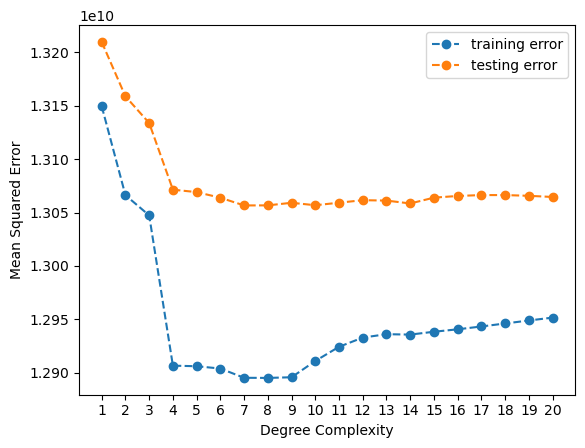

In [167]:
print(f'The Complexity that minimized Test Error was: {test_mses.index(min(test_mses)) + 1}')
plt.plot(range(1, 21), train_mses, '--o', label = 'training error')
plt.plot(range(1, 21), test_mses, '--o', label = 'testing error')
plt.xticks(range(1, 21), range(1, 21))
plt.xlabel('Degree Complexity')
plt.ylabel('Mean Squared Error')
plt.legend();

In [168]:
# function to determine best model complexity
def simple_cross_validation(X_train, y_train, X_test, y_test):
    best_pipe = None #placeholder for best model
    best_mse = np.inf #set best mse to infinity to begin
    for i in range(1, 21):
        pipe = Pipeline([('pfeat', PolynomialFeatures(degree = i, include_bias=False)), 
                    ('linreg', LinearRegression())])
        pipe.fit(X_train, y_train)
        test_preds = pipe.predict(X_test)
        test_mse = mean_squared_error(y_test, test_preds)
        if test_mse < best_mse:
            best_mse = test_mse
            best_pipe = pipe
    return best_pipe
### END SOLUTION

best_model = simple_cross_validation(X_train, y1_train, X_test, y1_test)
best_model.get_params() #should be degree = 10

{'memory': None,
 'steps': [('pfeat', PolynomialFeatures(degree=7, include_bias=False)),
  ('linreg', LinearRegression())],
 'verbose': False,
 'pfeat': PolynomialFeatures(degree=7, include_bias=False),
 'linreg': LinearRegression(),
 'pfeat__degree': 7,
 'pfeat__include_bias': False,
 'pfeat__interaction_only': False,
 'pfeat__order': 'C',
 'linreg__copy_X': True,
 'linreg__fit_intercept': True,
 'linreg__n_jobs': None,
 'linreg__normalize': 'deprecated',
 'linreg__positive': False}

In [169]:
pipe.score(X_train, y1_train)

0.027106934376178726

In [170]:
# Find the column with minimum MSE
minimum_mse = mses_df[mses_df['MSE']== mses_df['MSE'].min()]
minimum_mse

,Estimator,MSE
4,LR_All_Features,4.720682e+09


In [171]:
cali.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20640 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


## Train/Test Split

In [172]:
X = cali.drop('median_house_value', axis = 1)
y = cali['median_house_value']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)
print(X_train.shape)
print(X_test.shape)
print(type(X_train), type(y_train))

(14448, 9)
(6192, 9)
<class 'pandas.core.frame.DataFrame'> <class 'pandas.core.series.Series'>


### baseline predictions

In [173]:
baseline_train = np.array([y_train.mean()] * y_train.shape[0])
baseline_test = np.array([y_test.mean()] * y_test.shape[0])
mse_baseline_train = mean_squared_error(baseline_train, y_train)
mse_baseline_test = mean_squared_error(baseline_test, y_test)

print(baseline_train.shape, baseline_test.shape)
print(baseline_train)
print(baseline_test)
print(f'Baseline for training data: {mse_baseline_train}')
print(f'Baseline for testing data: {mse_baseline_test}') 

(14448,) (6192,)
[207030.36364895 207030.36364895 207030.36364895 ... 207030.36364895
 207030.36364895 207030.36364895]
[206448.54118217 206448.54118217 206448.54118217 ... 206448.54118217
 206448.54118217 206448.54118217]
Baseline for training data: 13344161077.266848
Baseline for testing data: 13248397193.602955


In [71]:
highest_corr = cali.corr()[['median_house_value']].nlargest(columns = 'median_house_value', n=2).index[1]
print(highest_corr)

median_income


In [72]:
cali.corr().loc['median_house_value'].sort_values()

latitude             -0.144160
longitude            -0.045967
population           -0.024650
total_bedrooms        0.049454
households            0.065843
housing_median_age    0.105623
total_rooms           0.134153
median_income         0.688075
median_house_value    1.000000
Name: median_house_value, dtype: float64

### simple model

In [73]:
X1 = X_train[['median_income']]
lr = LinearRegression().fit(X1, y_train)
model_1_train_mse = mean_squared_error(y_train, lr.predict(X1))
model_1_test_mse = mean_squared_error(y_test, lr.predict(X_test[['median_income']]))
print(f'Train MSE: {model_1_train_mse: .2f}')
print(f'Test MSE: {model_1_test_mse: .2f}')

Train MSE:  7005758924.04
Test MSE:  7024807063.37


## OneHotEncoder


In [74]:
ocean_proximity_train = X_train[['ocean_proximity']]
ocean_proximity_test = X_test[['ocean_proximity']]
ocean_proximity_train.head()

,ocean_proximity
756,NEAR BAY
10829,<1H OCEAN
4189,<1H OCEAN
11553,<1H OCEAN
6227,<1H OCEAN


In [75]:
ohe = OneHotEncoder(sparse = False, drop = 'if_binary')
model_2_train = ohe.fit_transform(ocean_proximity_train)
model_2_test = ohe.fit_transform(ocean_proximity_test)
model_2_train

array([[0., 0., 0., 1., 0.],
       [1., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0.],
       ...,
       [1., 0., 0., 0., 0.],
       [0., 0., 0., 1., 0.],
       [0., 1., 0., 0., 0.]])

In [76]:
model_2 = LinearRegression().fit(model_2_train, y_train)
model_2_train_mse = mean_squared_error(y_train, model_2.predict(model_2_train))
model_2_test_mse = mean_squared_error(y_test, model_2.predict(model_2_test))
print(f'Train MSE: {model_2_train_mse: .2f}')
print(f'Test MSE: {model_2_test_mse: .2f}')

Train MSE:  9947381366.84
Test MSE:  10618358451.34


### Using make_column_transformer

In [77]:
col_transformer = make_column_transformer((OneHotEncoder(drop = 'if_binary'), ['ocean_proximity']), 
                                          remainder='passthrough')
col_transformer.fit_transform(X_train[['median_income', 'ocean_proximity']])

array([[0.    , 0.    , 0.    , 1.    , 0.    , 6.3501],
       [1.    , 0.    , 0.    , 0.    , 0.    , 8.1839],
       [1.    , 0.    , 0.    , 0.    , 0.    , 3.5638],
       ...,
       [1.    , 0.    , 0.    , 0.    , 0.    , 7.723 ],
       [0.    , 0.    , 0.    , 1.    , 0.    , 3.5114],
       [0.    , 1.    , 0.    , 0.    , 0.    , 1.4958]])

In [78]:
pipe1 = Pipeline([('col_transformer', col_transformer),
                 ('linreg', LinearRegression())])
pipe1.fit(X_train[['median_income', 'ocean_proximity']], y_train)
print(pipe1.named_steps)
pipe1

{'col_transformer': ColumnTransformer(remainder='passthrough',
                  transformers=[('onehotencoder',
                                 OneHotEncoder(drop='if_binary'),
                                 ['ocean_proximity'])]), 'linreg': LinearRegression()}


Pipeline(steps=[('col_transformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(drop='if_binary'),
                                                  ['ocean_proximity'])])),
                ('linreg', LinearRegression())])

In [84]:
print(type(pipe1))
model_1 = pipe1.fit(X_train[['median_income', 'ocean_proximity']], y_train)
print(type(model_1))

<class 'sklearn.pipeline.Pipeline'>
<class 'sklearn.pipeline.Pipeline'>


In [81]:
pipe1_train_mse = mean_squared_error(y_train, pipe1.predict(X_train[['median_income', 'ocean_proximity']]))
pipe1_test_mse = mean_squared_error(y_test, pipe1.predict(X_test[['median_income', 'ocean_proximity']]) )
print(f'Train MSE: {pipe1_train_mse: .2f}')
print(f'Test MSE: {pipe1_test_mse: .2f}')

Train MSE:  5451331629.86
Test MSE:  5575236870.33


In [82]:
print(pipe1.score(X_train,y_train))
print(pipe1.score(X_test,y_test))

0.5853152491192765
0.5933445752766702


## Including PolynomialFeatures

In [ ]:
poly_ohe = make_column_transformer((OneHotEncoder(drop = 'if_binary'), ['ocean_proximity']),
                                           (PolynomialFeatures(include_bias = False, degree = 2), ['median_income']))

In [ ]:
pipe2 = Pipeline([('transformer', poly_ohe),
                 ('linreg', LinearRegression())])
pipe2.fit(X_train[['median_income', 'ocean_proximity']], y_train)


In [ ]:
quad_train_preds = pipe2.predict(X_train[['median_income', 'ocean_proximity']])
quad_test_preds = pipe2.predict(X_test[['median_income', 'ocean_proximity']])
quad_train_mse = mean_squared_error(y_train, quad_train_preds)
quad_test_mse = mean_squared_error(y_test, quad_test_preds)

print(f'Train MSE: {quad_train_mse: .2f}')
print(f'Test MSE: {quad_test_mse: .2f}')

In [ ]:
print(pipe2.score(X_train,y_train))
print(pipe2.score(X_test,y_test))

In [ ]:
pipe4 = Pipeline([('transformer', )])

In [ ]:
cali.info()

### Including More Features

In [179]:
features = ['longitude', 'latitude', 'housing_median_age', 'total_rooms', 'households','population', 'median_income', 'ocean_proximity']

In [180]:
X_train[features].head()

,longitude,latitude,housing_median_age,total_rooms,households,population,median_income,ocean_proximity
16614,-121.12,35.58,16.0,4109.0,626.0,1298.0,3.4799,NEAR OCEAN
10785,-117.92,33.63,34.0,2479.0,490.0,1131.0,4.9643,<1H OCEAN
522,-122.23,37.76,52.0,1316.0,162.0,378.0,5.2915,NEAR BAY
4893,-118.25,34.02,32.0,1311.0,396.0,1792.0,2.3304,<1H OCEAN
2474,-119.85,36.43,23.0,1824.0,362.0,1146.0,2.8913,INLAND


In [181]:
poly_ohe = make_column_transformer((PolynomialFeatures(), make_column_selector(dtype_include=np.number)),
                                     (OneHotEncoder(drop = 'if_binary', sparse = False), ['ocean_proximity']))

In [184]:
poly_ohe_d3 = make_column_transformer((PolynomialFeatures(degree = 3), make_column_selector(dtype_include=np.number)),
                                     (OneHotEncoder(drop = 'if_binary', sparse = False), ['ocean_proximity']))
pipe4 = Pipeline([('transformer', poly_ohe_d3),
                ('linreg', LinearRegression())])
pipe4.fit(X_train[features], y_train)
train_mse = mean_squared_error(y_train, pipe4.predict(X_train[features]) )
test_mse = mean_squared_error(y_test, pipe4.predict(X_test[features]) )
print(train_mse)
print(test_mse)

3539224251.0906353
7493210337.423198


In [176]:
X_train[features]

,housing_median_age,total_rooms,households,median_income,ocean_proximity
16614,16.0,4109.0,626.0,3.4799,NEAR OCEAN
10785,34.0,2479.0,490.0,4.9643,<1H OCEAN
522,52.0,1316.0,162.0,5.2915,NEAR BAY
4893,32.0,1311.0,396.0,2.3304,<1H OCEAN
2474,23.0,1824.0,362.0,2.8913,INLAND
...,...,...,...,...,...
10424,5.0,3549.0,534.0,5.3705,NEAR OCEAN
8969,36.0,1225.0,227.0,5.4663,<1H OCEAN
9410,24.0,221.0,38.0,5.1292,NEAR BAY
19546,31.0,215.0,66.0,1.7500,INLAND


In [174]:
train_mses = []
test_mses = []
#for degree in 1 - 5
for i in range(1, 6):
    #create pipeline with PolynomialFeatures degree i
    poly_ohe = make_column_transformer((PolynomialFeatures(degree = i), make_column_selector(dtype_include=np.number)),
                                     (OneHotEncoder(drop = 'if_binary', sparse = False), ['ocean_proximity']))
    pipe = Pipeline([('transformer', poly_ohe), 
                     ('linreg', LinearRegression())])

    #fit on train
    pipe.fit(X_train[features], y_train)
    #predict on train and test
    p1 = pipe.predict(X_train[features])
    p2 = pipe.predict(X_test[features])
   
    train_mses.append(mean_squared_error(y_train, p1))
    test_mses.append(mean_squared_error(y_test, p2))

print(train_mses)
print(test_mses)
pipe
print(pipe.score(X_train,y_train))
print(pipe.score(X_test,y_test))

[5311595988.422651, 5009132385.711086, 4637099629.943523, 5327917629.405138, 6055692999.039363]
[5107784393.329177, 4814489413.286769, 4502718169.821556, 5239141590.935857, 11781411716.70792]
0.5461915541955005
0.1107292795843543


In [104]:
best_complexity = test_mses.index(min(test_mses)) + 1
best_mse = min(test_mses)
### END SOLUTION

# Answer check
print(f'The best degree polynomial model is:  {best_complexity}')
print(f'The smallest mean squared error on the test data is : {best_mse: .2f}')

The best degree polynomial model is:  3
The smallest mean squared error on the test data is :  4679762536.87


In [101]:
X_train

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity
756,-122.04,37.66,23.0,2419.0,348.0,1066.0,384.0,6.3501,NEAR BAY
10829,-117.94,33.67,26.0,2552.0,314.0,925.0,323.0,8.1839,<1H OCEAN
4189,-118.21,34.12,35.0,1937.0,439.0,1523.0,412.0,3.5638,<1H OCEAN
11553,-117.98,33.74,29.0,3443.0,635.0,2257.0,620.0,4.7404,<1H OCEAN
6227,-117.93,34.06,28.0,3342.0,688.0,2210.0,647.0,3.4596,<1H OCEAN
...,...,...,...,...,...,...,...,...,...
8060,-118.20,33.85,46.0,1854.0,462.0,1360.0,429.0,2.4844,<1H OCEAN
12505,-121.44,38.56,52.0,906.0,165.0,257.0,166.0,2.8542,INLAND
6718,-118.16,34.13,36.0,4003.0,647.0,1337.0,631.0,7.7230,<1H OCEAN
267,-122.19,37.77,52.0,2329.0,445.0,1144.0,417.0,3.5114,NEAR BAY


In [102]:
y_train

756      350000.0
10829    367000.0
4189     170500.0
11553    207500.0
6227     202800.0
           ...   
8060     158200.0
12505    139400.0
6718     500001.0
267      151200.0
20613     53400.0
Name: median_house_value, Length: 14448, dtype: float64

## Permutation Importance

In [ ]:
"""r = permutation_importance(model, X_val, y_val,
...                            n_repeats=30,
...                            random_state=0)
for i in r.importances_mean.argsort()[::-1]:
...     if r.importances_mean[i] - 2 * r.importances_std[i] > 0:
...         print(f"{diabetes.feature_names[i]:<8}"
...               f"{r.importances_mean[i]:.3f}"
...               f" +/- {r.importances_std[i]:.3f}")

In [91]:
r = permutation_importance(pipe1, X_train, y_train,
...                            n_repeats=30,)

In [94]:
for i in r.importances_mean.argsort()[::-1]:
...     if r.importances_mean[i] - 2 * r.importances_std[i] > 0:
...         print(f"{cali.columns[i]:<8}"
...               f"{r.importances_mean[i]:.3f}"
...               f" +/- {r.importances_std[i]:.3f}")

median_income0.725 +/- 0.008
median_house_value0.249 +/- 0.004


In [112]:
pipe4.score

<function sklearn.pipeline.Pipeline.score(self, X, y=None, sample_weight=None)>

In [113]:
print(pipe4.score(X_train,y_train))
print(pipe4.score(X_test,y_test))

0.652747193217889
0.6586600952937767


In [116]:
r = permutation_importance(pipe4, X_train[features], y_train,
...                            n_repeats=30,)

In [118]:
for i in r.importances_mean.argsort()[::-1]:
...     if r.importances_mean[i] - 2 * r.importances_std[i] > 0:
...         print(f" {cali.columns[i]:<8}"
...               f" {r.importances_mean[i]:.3f}"
...               f" +/- {r.importances_std[i]:.3f}")

 housing_median_age 1.274 +/- 0.035
 total_rooms 1.181 +/- 0.013
 latitude 0.507 +/- 0.017
 total_bedrooms 0.150 +/- 0.003
 longitude 0.127 +/- 0.004


In [119]:
r = permutation_importance(pipe4, X_test[features], y_test,
...                            n_repeats=30,)

In [120]:
for i in r.importances_mean.argsort()[::-1]:
...     if r.importances_mean[i] - 2 * r.importances_std[i] > 0:
...         print(f" {cali.columns[i]:<8}"
...               f" {r.importances_mean[i]:.3f}"
...               f" +/- {r.importances_std[i]:.3f}")

 total_rooms 1.212 +/- 0.021
 housing_median_age 1.077 +/- 0.043
 latitude 0.456 +/- 0.012
 total_bedrooms 0.138 +/- 0.004
 longitude 0.122 +/- 0.006
